In [39]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

import statsmodels.api as sm
import matplotlib.dates as mdates
from sklearn.preprocessing import StandardScaler

In [40]:
df_sites = pd.read_csv('data/t_sites.csv')
df_sites = df_sites[['site','besskwh','besskw','pvkw']]
df_sites['site'] = df_sites['site'].astype(str)

In [41]:
result_path = 'results'

In [42]:
peak_initial_hour = 7
peak_final_hour = 24

In [43]:
manual_site_filter = [17, 59, 71, 90, 98] # filter out incomplete sites

In [44]:
results = {}
for file in os.listdir(result_path):
    if file.endswith('.csv'):
        df = pd.read_csv(os.path.join(result_path, file), parse_dates=['ts'])
        df =df[~df['site'].isin(manual_site_filter)]
        df['off_peak_consumption'] = np.where((df['ts'].dt.hour < peak_initial_hour) | (df['ts'].dt.hour > peak_final_hour), df['consumption_wh'], 0)
        df['peak_consumption'] = np.where((df['ts'].dt.hour >= peak_initial_hour) & (df['ts'].dt.hour <= peak_final_hour), df['consumption_wh'], 0)
        scenario = file.split('.')[0]
        results[scenario] = df

In [45]:
for scenario,df in results.items():
    scenario_type = None
    if 'no_ev' in scenario:
        scenario_type = 'no_ev'
    elif 'km' in scenario:
        scenario_type = 'km'
    elif 'tariff' in scenario:
        scenario_type = 'tariff'
    elif 'base' in scenario:
        scenario_type = 'base'

    df['scenario'] = scenario
    df['scenario_type'] = scenario_type
    df['site'] = df['site'].astype(str)

df_results = pd.concat(results.values())
df_results.to_csv('all_results.csv', index=False)

In [46]:
incomplete_sites = df_results.groupby(['site']).agg({'ts':'count'})
max_incomplete = incomplete_sites['ts'].max()
incomplete_sites = incomplete_sites[incomplete_sites['ts'] < max_incomplete].index

In [47]:
incomplete_sites

Index([], dtype='object', name='site')

## Cost analysis

In [48]:
feed_in_tariff = 5 # p/kWh

In [49]:
df_grouped ={}
df_base_grouped = {}
for scenario, df in results.items():
    df['cost'] = df['tariff']*df['grid_import']*1e-5 + feed_in_tariff*df['grid_export']*1e-5
    dfg = df.groupby('site').agg({'cost': 'sum','off_peak_consumption': 'sum', 'peak_consumption': 'sum', 'production_wh': 'sum', 'consumption_wh': 'sum'})
    if 'no_ev' in scenario:
        scenario = scenario.replace('no_ev_', '')
        df_base_grouped[scenario] = dfg
    else:
        df_grouped[scenario] = dfg

In [50]:
costs = {}
for scenario, df in df_grouped.items():
    if scenario in df_base_grouped.keys():
        costs[scenario] = df['cost'] - df_base_grouped[scenario]['cost']
df_costs = pd.DataFrame(costs)

### Base scenario

In [51]:
cost_of_fuel = 1.5 # p/L
fuel_efficiency = 10 # km/L

cost_public_ultra_fast_charger = 81 # p/kWh
cost_public_fast_charger = 56 # p/kWh
ev_efficiency = 0.188 # kWh/km

In [52]:
ev_usage = results['no_ev_base_scenario'].groupby('site').agg({'ev_usage': 'sum'})
df_types_oc = pd.DataFrame({'fuel_car': (ev_usage['ev_usage']/(24*ev_efficiency*1000))*fuel_efficiency*cost_of_fuel*1e-2,
              'ultra_fast_charger': (ev_usage['ev_usage']/24)*cost_public_ultra_fast_charger*1e-5,
              'fast_charger': (ev_usage['ev_usage']/24)*cost_public_fast_charger*1e-5,
              'base_scenario': df_costs['base_scenario']})

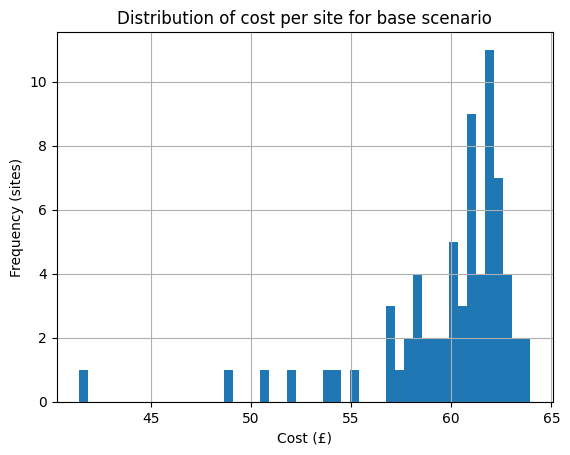

In [96]:
# histogram of costs of base scenario
df_types_oc['base_scenario'].hist(bins=50)
plt.xlabel('Cost (£)')
plt.ylabel('Frequency (sites)')
plt.title('Distribution of cost per site for base scenario')
plt.show()

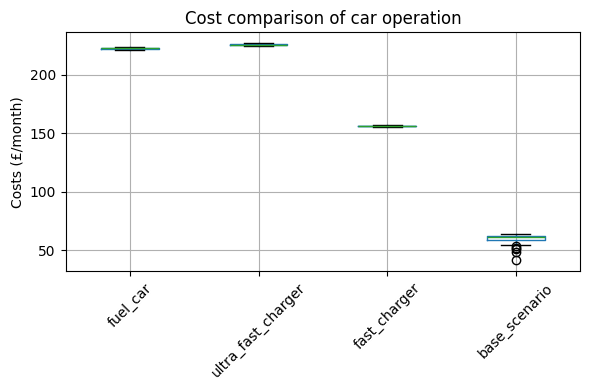

In [90]:
df_types_oc.boxplot(figsize=(6,4))
plt.ylabel('Costs (£/month)')
plt.title('Cost comparison of car operation')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [98]:
df_types_oc.describe()

,fuel_car,ultra_fast_charger,fast_charger,base_scenario
count,70.000000,70.000000,70.000000,70.000000
mean,222.655262,226.039622,156.274306,59.843744
std,0.545431,0.553721,0.382820,3.725362
min,221.577965,224.945950,155.518188,41.426259
25%,222.260728,225.639091,155.997396,58.770594
50%,222.639829,226.023955,156.263475,60.974493
75%,223.030078,226.420135,156.537377,62.025309
max,223.779919,227.181374,157.063666,63.951501


### Alterative scenarios

In [54]:
# sort columns by average cost
df_costs_km = df_costs[['base_scenario'] + list(df_costs.columns[df_costs.columns.str.contains('km')])]
df_costs_tariff = df_costs[['base_scenario'] + list(df_costs.columns[df_costs.columns.str.contains('tariff')])]

df_costs = df_costs.reindex(df_costs.mean().sort_values().index, axis=1)
df_costs_km = df_costs_km.reindex(df_costs_km.mean().sort_values().index, axis=1)
df_costs_tariff = df_costs_tariff.reindex(df_costs_tariff.mean().sort_values().index, axis=1)

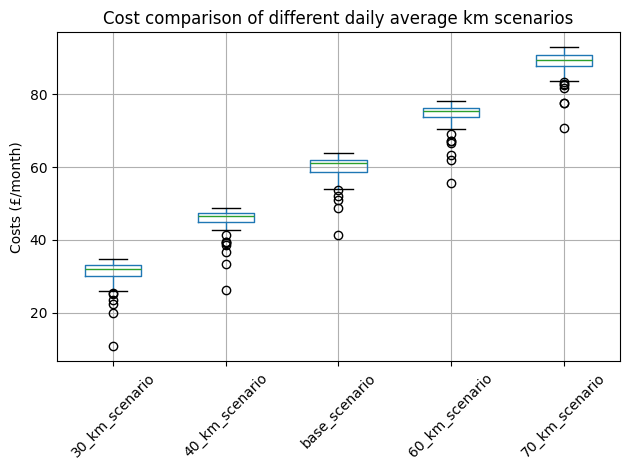

In [92]:
# plot box plot

df_costs_km.boxplot()
plt.ylabel('Costs (£/month)')
plt.title('Cost comparison of different daily average km scenarios')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [89]:
df_stats = df_costs_km.describe().style.format(decimal='.', thousands=',', precision=2)
df_stats.to_latex('df_stats.tex')

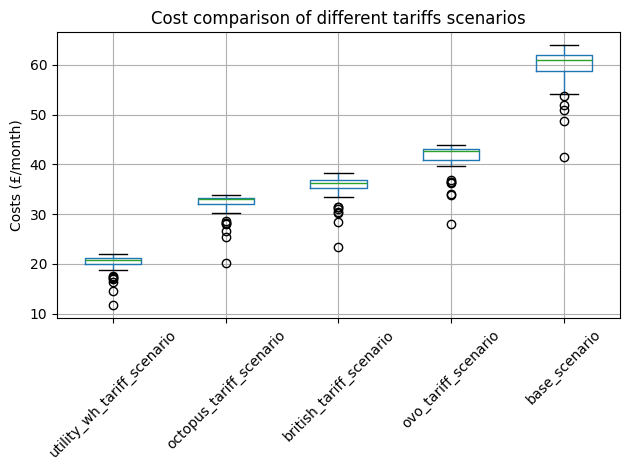

In [93]:
# plot box plot
import matplotlib.pyplot as plt
df_costs_tariff.boxplot()
plt.ylabel('Costs (£/month)')
plt.title('Cost comparison of different tariffs scenarios')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [88]:
df_stats = df_costs_tariff.describe().style.format(decimal='.', thousands=',', precision=2)
df_stats.to_latex('df_stats.tex')

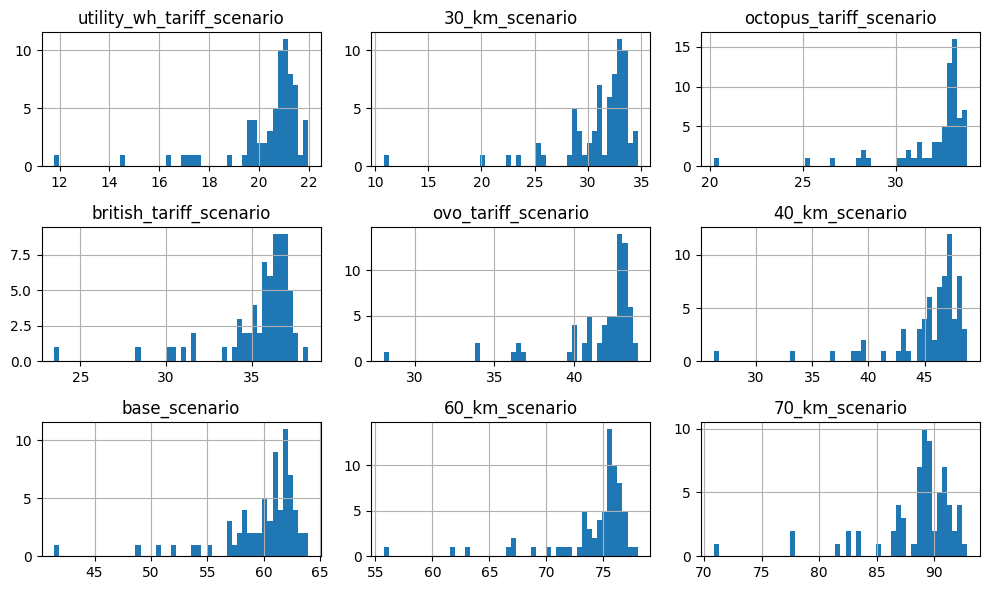

In [59]:
# histogram of costs
df_costs.hist(bins=50, figsize=(10,6))
plt.tight_layout()
plt.show()

## Shape analysis

In [60]:
df_costs['base_scenario'].describe()

count    70.000000
mean     59.843744
std       3.725362
min      41.426259
25%      58.770594
50%      60.974493
75%      62.025309
max      63.951501
Name: base_scenario, dtype: float64

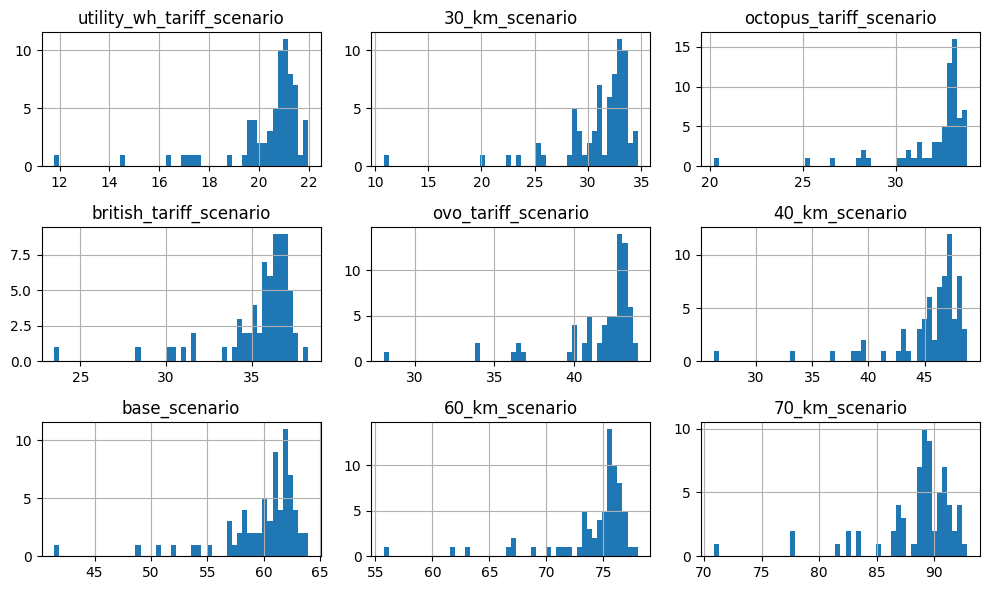

In [61]:
# histogram of costs
df_costs.hist(bins=50, figsize=(10,6))
plt.tight_layout()
plt.show()

In [62]:
master = []
params = {}
# run a regression to see how the costs are affected by the variables
for scenario, df in df_grouped.items():
       df_variables = df.reset_index().merge(df_sites, on='site')
       df_variables['consumption_wh'] = df_variables['consumption_wh']/1000
       df_variables['production_wh'] = df_variables['production_wh']/1000
       df_variables['off_peak_consumption'] = df_variables['off_peak_consumption']/1000
       df_variables['peak_consumption'] = df_variables['peak_consumption']/1000

       df_variables.rename(columns={'off_peak_consumption': 'off_peak_consumption_kwh',
                             'peak_consumption': 'peak_consumption_kwh',
                             'production_wh': 'production_kwh',
                             'consumption_wh': 'consumption_kwh'}, inplace=True)
       

       df_variables['peak_consumption_ratio'] = df_variables['peak_consumption_kwh']/df_variables['consumption_kwh']
       df_variables['consumption_over_production'] = df_variables['consumption_kwh']/df_variables['production_kwh']
       scaler = StandardScaler()
       
       X = df_variables[['off_peak_consumption_kwh', 'peak_consumption_kwh',
              'production_kwh', 'consumption_kwh', 'peak_consumption_ratio', 'consumption_over_production'
              , 'besskwh', 'besskw', 'pvkw']]
       X = scaler.fit_transform(X)
       X = pd.DataFrame(X, columns=['off_peak_consumption_kwh', 'peak_consumption_kwh',
                                          'production_kwh', 'consumption_kwh', 'peak_consumption_ratio', 'consumption_over_production'
              , 'besskwh', 'besskw', 'pvkw'])
       X = sm.add_constant(X)

       y = df_variables['cost']
       model = sm.OLS(y, X).fit()

       

       scenario_type = 'km' if 'km' in scenario else 'tariff'
       scenario_type = 'base' if 'base' in scenario else scenario_type

       df_variables ['scenario'] = scenario
       df_variables ['scenario_type'] = scenario_type

       master.append(df_variables)
       params[scenario] = model.params


       #plots
       df_variables.plot.scatter(x='consumption_kwh', y='cost')
       plt.xlabel('Consumption (kWh)')
       plt.ylabel('EV Operational Cost (£)')
       plt.title('Cost vs Consumption: ' + scenario)
       plt.grid(alpha=0.3)
       plt.tight_layout()
       plt.savefig(f'figs/variable_relations/cost_vs_consumption_{scenario}.png')
       plt.close()

       df_variables.plot.scatter(x='production_kwh', y='cost')
       plt.xlabel('Production (kWh)')
       plt.ylabel('EV Operational Cost (£)')
       plt.title('Cost vs Production ' + scenario)
       plt.grid(alpha=0.3)
       plt.tight_layout()
       plt.savefig(f'figs/variable_relations/cost_vs_production_{scenario}.png')
       plt.close()

       df_variables.plot.scatter(x='off_peak_consumption_kwh', y='cost')
       plt.xlabel('Off Peak Consumption (kWh)')
       plt.ylabel('EV Operational Cost (£)')
       plt.title('Cost vs Off Peak Consumption ' + scenario)
       plt.grid(alpha=0.3)
       plt.tight_layout()
       plt.savefig(f'figs/variable_relations/cost_vs_off_peak_consumption_{scenario}.png')
       plt.close()

       df_variables.plot.scatter(x='peak_consumption_kwh', y='cost')
       plt.xlabel('Peak Consumption (kWh)')
       plt.ylabel('EV Operational Cost (£)')
       plt.title('Cost vs Peak Consumption ' + scenario)
       plt.grid(alpha=0.3)
       plt.tight_layout()
       plt.savefig(f'figs/variable_relations/cost_vs_peak_consumption_{scenario}.png')
       plt.close()

       df_variables.plot.scatter(x='peak_consumption_ratio', y='cost')
       plt.xlabel('Peak Consumption Ratio')
       plt.ylabel('EV Operational Cost (£)')
       plt.title('Cost vs Peak Consumption Ratio ' + scenario)
       plt.grid(alpha=0.3)
       plt.tight_layout()
       plt.savefig(f'figs/variable_relations/cost_vs_peak_consumption_ratio_{scenario}.png')
       plt.close()

       df_variables.plot.scatter(x='consumption_over_production', y='cost')
       plt.xlabel('Consumption over Production')
       plt.ylabel('EV Operational Cost (£)')
       plt.title('Cost vs Consumption over Production ' + scenario)
       plt.grid(alpha=0.3)
       plt.tight_layout()
       plt.savefig(f'figs/variable_relations/cost_vs_consumption_over_production_{scenario}.png')
       plt.close()


/Users/dguiraldes/Documents/MSc UCL/Term 2/Transport/project/.venv/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


In [63]:
df_master = pd.concat(master)
df_params = pd.DataFrame(params)

In [64]:
# deviations from the base scenario
df_params_deviation = df_params.copy()
for col in df_params_deviation.columns:
    df_params_deviation[col] = df_params_deviation[col] - df_params['base_scenario']

In [65]:
df_master.to_csv('master.csv')

In [66]:
df_params_deviation

,40_km_scenario,ovo_tariff_scenario,utility_wh_tariff_scenario,base_scenario,60_km_scenario,70_km_scenario,30_km_scenario,octopus_tariff_scenario,british_tariff_scenario
const,-14.498355,-27.805017,-61.565966,0.0,14.283885,28.625639,-28.889061,-42.893814,-37.452957
off_peak_consumption_kwh,-0.220312,-8.059193,-17.582184,0.0,0.137941,0.047516,-0.303632,-12.229508,-10.845158
peak_consumption_kwh,-0.139550,1.335915,3.367086,0.0,-0.128952,-0.070167,-0.060086,2.168861,1.883940
production_kwh,0.264130,1.119220,2.777340,0.0,-0.238051,-0.015350,0.470574,1.825335,1.690289
consumption_kwh,-0.219576,-4.165015,-8.814760,0.0,0.007590,-0.012845,-0.223216,-6.235187,-5.553043
peak_consumption_ratio,-0.080492,1.390124,3.257189,0.0,0.092605,0.287920,-0.069275,2.251606,1.897686
consumption_over_production,0.195540,-0.395388,-0.702959,0.0,-0.122327,0.252690,0.425763,-0.599955,-0.403474
besskwh,0.230036,0.477994,0.101997,0.0,0.900503,0.702291,0.783540,0.435300,0.806600
besskw,-0.071102,-1.137050,-2.331833,0.0,-0.611625,-0.671922,-0.843728,-1.757139,-1.756099
pvkw,0.119451,-0.114565,-0.520769,0.0,0.086570,0.184447,-0.010258,-0.336508,-0.344341


In [97]:
# same plots as before, using the results dataframe
days_between = ('2019-10-15', '2019-10-17')
df_dates = df_results[(df_results['ts'].dt.date >= pd.to_datetime(days_between[0]).date()) &
                    (df_results['ts'].dt.date <= pd.to_datetime(days_between[1]).date())]

interesting_sites = [69] #[34, 46, 76, 25, 89, 80, 37, 78]

for site in interesting_sites:
    for scenario in df_dates['scenario'].unique():
        df_day = df_dates[(df_dates['scenario'] == scenario) & (df_dates['site'] == str(site))]
        fig, ax = plt.subplots(figsize=(10, 4))
        ax.plot(df_day['ts'], df_day['grid_import'], label='Grid Import', color='red')
        ax.fill_between(df_day['ts'], df_day['grid_import'], 0, color='red', alpha=0.3)
        ax.plot(df_day['ts'], df_day['grid_export'], label='Grid Export', color='green')
        ax.fill_between(df_day['ts'], df_day['grid_export'], 0, color='green', alpha=0.3)
        ax.plot(df_day['ts'], df_day['ev_charge'], label='EV Charging', color='orange')
        ax.fill_between(df_day['ts'], df_day['ev_charge'], 0, color='orange', alpha=0.3)
        ax.plot(df_day['ts'], df_day['production_wh'], label='Production', color='yellow')
        ax.fill_between(df_day['ts'], df_day['production_wh'], 0, color='yellow', alpha=0.3)
        ax.plot(df_day['ts'], df_day['consumption_wh'], label='Consumption', color='blue')
        ax.fill_between(df_day['ts'], df_day['consumption_wh'], 0, color='blue', alpha=0.3)
        ax.plot(df_day['ts'], df_day['battery_charge'], label='Battery Charge', color='purple')
        ax.fill_between(df_day['ts'], df_day['battery_charge'], 0, color='purple', alpha=0.3)
        ax.plot(df_day['ts'], df_day['battery_discharge'], label='Battery Discharge', color='pink')
        ax.fill_between(df_day['ts'], df_day['battery_discharge'], 0, color='pink', alpha=0.3)
        ax.set_xlabel('Hour')
        ax.set_ylabel('Energy (Wh)')
        ax.set_title(f'Energy Flows for Site {site} - {scenario}')
        ax.grid(alpha=0.3)
        ax.xaxis.set_major_locator(mdates.HourLocator(interval=4))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m %H:00'))
        plt.xticks(rotation=45)
        ax.legend()
        plt.tight_layout()
        plt.savefig(f'figs/energy_flows/{site}_{scenario}.png')
        plt.close()

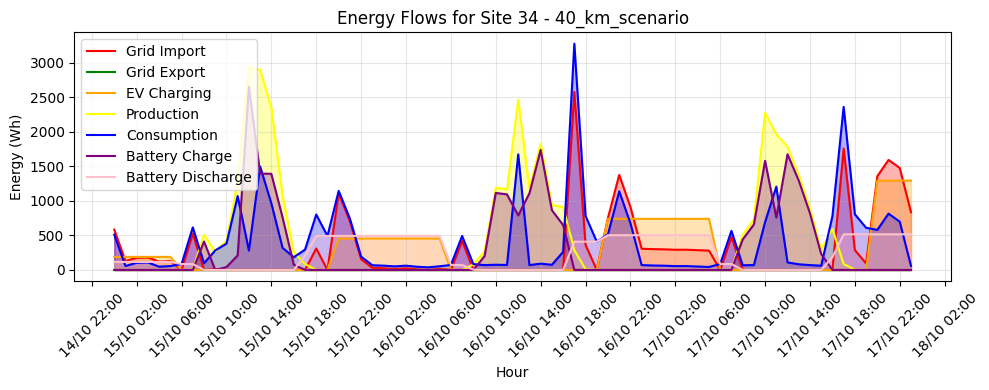

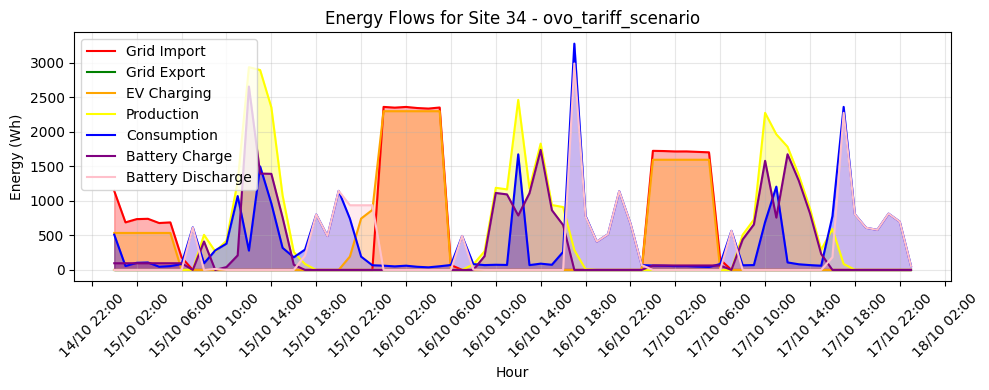

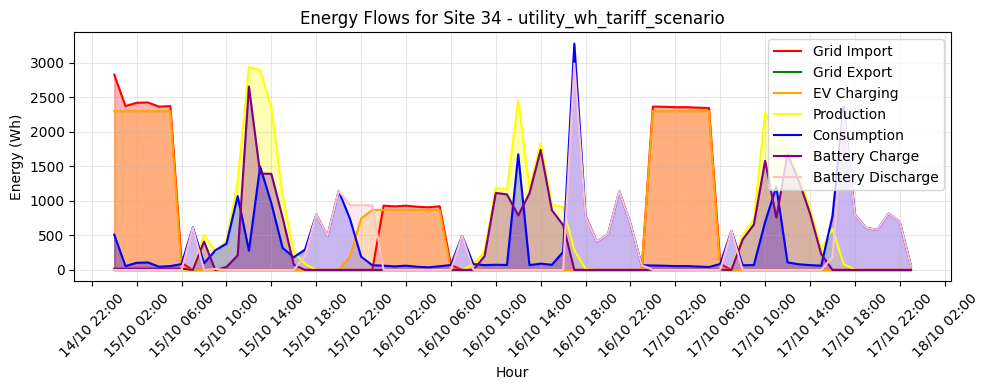

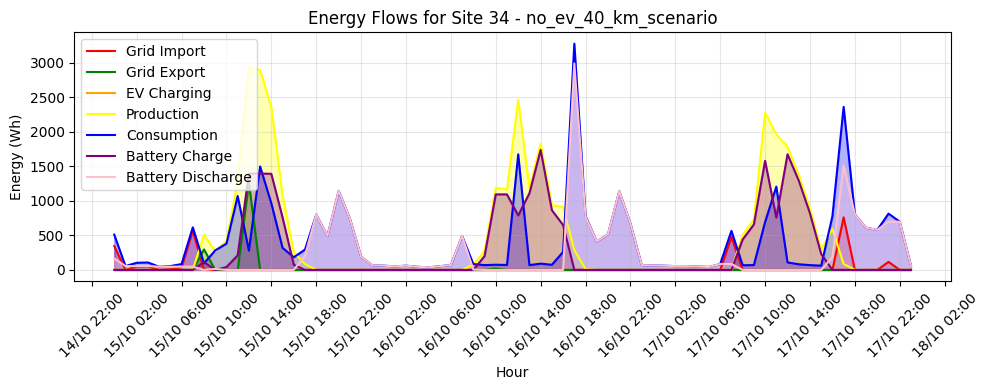

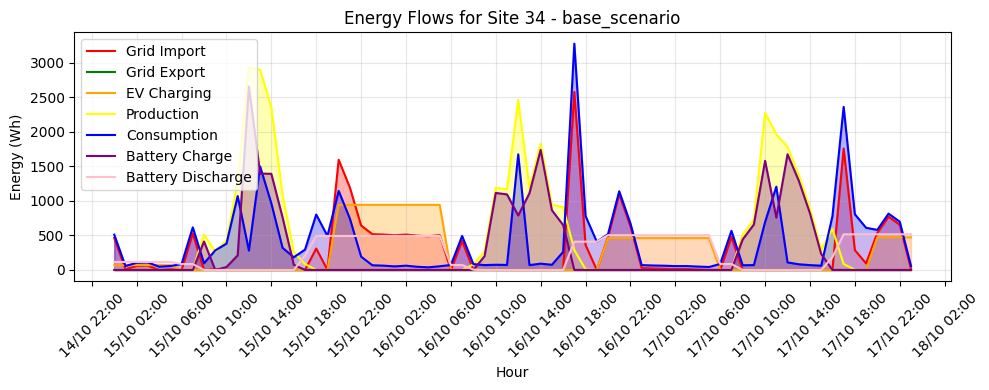

...

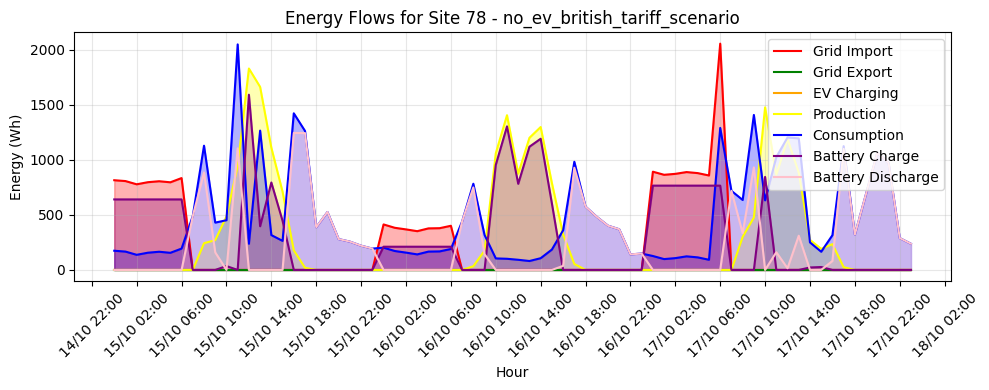

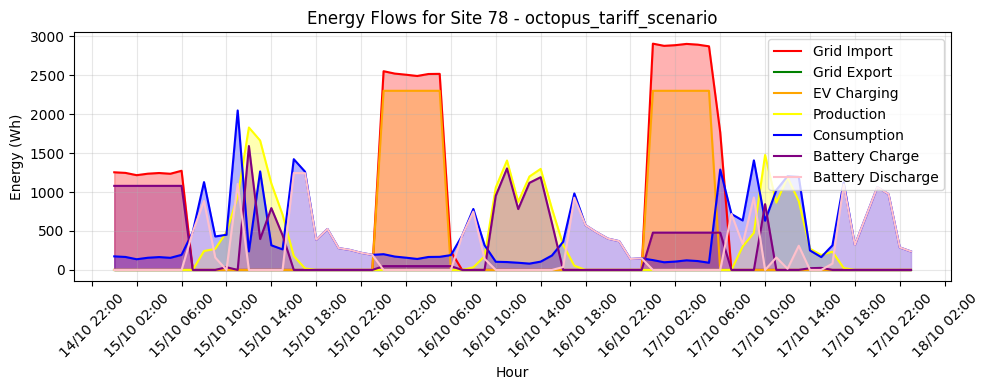

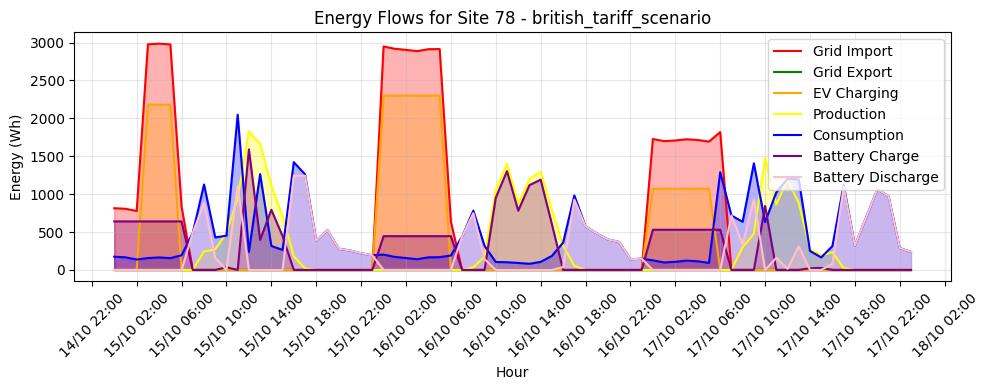

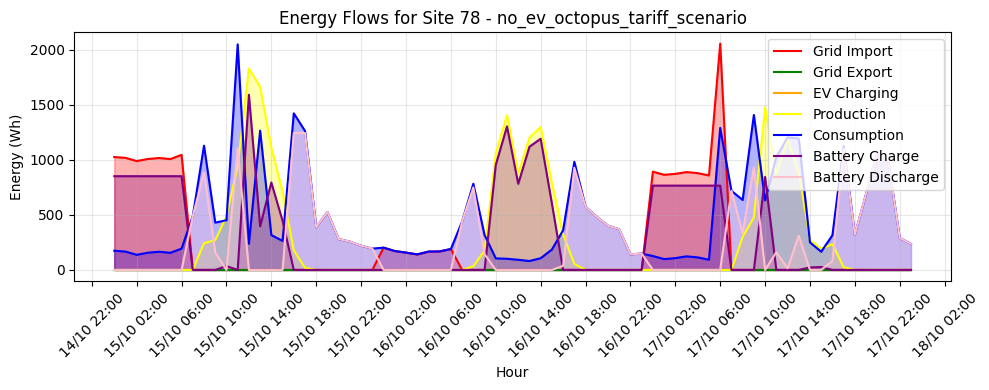

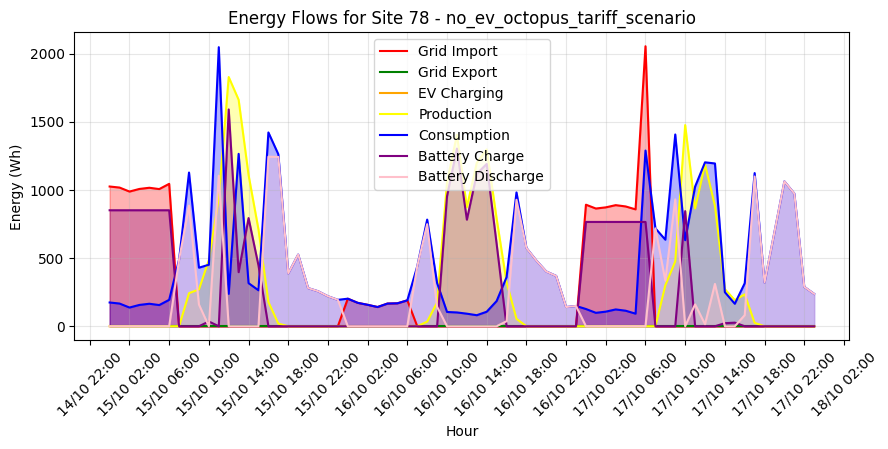

In [82]:
df_day = df_dates[(df_dates['scenario'] == scenario) & (df_dates['site'] == str(site))]
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(df_day['ts'], df_day['grid_import'], label='Grid Import', color='red')
ax.fill_between(df_day['ts'], df_day['grid_import'], 0, color='red', alpha=0.3)
ax.plot(df_day['ts'], df_day['grid_export'], label='Grid Export', color='green')
ax.fill_between(df_day['ts'], df_day['grid_export'], 0, color='green', alpha=0.3)
ax.plot(df_day['ts'], df_day['ev_charge'], label='EV Charging', color='orange')
ax.fill_between(df_day['ts'], df_day['ev_charge'], 0, color='orange', alpha=0.3)
ax.plot(df_day['ts'], df_day['production_wh'], label='Production', color='yellow')
ax.fill_between(df_day['ts'], df_day['production_wh'], 0, color='yellow', alpha=0.3)
ax.plot(df_day['ts'], df_day['consumption_wh'], label='Consumption', color='blue')
ax.fill_between(df_day['ts'], df_day['consumption_wh'], 0, color='blue', alpha=0.3)
ax.plot(df_day['ts'], df_day['battery_charge'], label='Battery Charge', color='purple')
ax.fill_between(df_day['ts'], df_day['battery_charge'], 0, color='purple', alpha=0.3)
ax.plot(df_day['ts'], df_day['battery_discharge'], label='Battery Discharge', color='pink')
ax.fill_between(df_day['ts'], df_day['battery_discharge'], 0, color='pink', alpha=0.3)
ax.set_xlabel('Hour')
ax.set_ylabel('Energy (Wh)')
ax.set_title(f'Energy Flows for Site {site} - {scenario}')
ax.grid(alpha=0.3)
ax.xaxis.set_major_locator(mdates.HourLocator(interval=4))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d/%m %H:00'))
plt.xticks(rotation=45)
ax.legend()

plt.show()

In [77]:
df_day['ts'].iloc[0]

Timestamp('2019-10-15 00:00:00')